## **1. Installing Required Libraries**


In [ ]:
!pip install wfdb
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 105.9 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.3.1 which is incompatible.
dask-cudf-cu12 25.6.0 requires pandas<2.2.4dev0,>=2.0, but you have pandas 2.3.1 which is incompatible.
cudf-cu12 25.6.0 requires pandas<2.2.4dev0,>=2.0, but you have pandas 2.3.1 which is incompatible.


## **2. Importing Required Libraries**

In [ ]:
import numpy as np
import scipy.signal
from skimage.transform import resize
import wfdb
import scipy
from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.manifold import trustworthiness
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import pickle
import os
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.patches as mpatches
from sklearn.metrics import f1_score
from collections import Counter
import matplotlib.lines as mlines
from matplotlib.colors import ListedColormap
import plotly.express as px
import string
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import time

## **3. Mounting my Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **4. Collecting Signals from Different Classes Across All Recordings**


In [ ]:
def load_all_ecg_records(input_file_path, record_number_list, fs):
    # Initialize lists
    normal_segments_signal1, normal_segments_signal2 = [], []
    ventricular_segments_signal1, ventricular_segments_signal2 = [], []
    supraventricular_segments_signal1, supraventricular_segments_signal2 = [], []
    fusion_segments_signal1, fusion_segments_signal2 = [], []
    unknown_segments_signal1, unknown_segments_signal2 = [], []
    other_segments_signal1, other_segments_signal2 = [], []

    normal_segments_subclass, ventricular_segments_subclass = [], []
    supraventricular_segments_subclass, fusion_segments_subclass = [], []
    unknown_segments_subclass, other_segments_subclass = [], []

    normal_segments_record_number, ventricular_segments_record_number = [], []
    supraventricular_segments_record_number, fusion_segments_record_number = [], []
    unknown_segments_record_number, other_segments_record_number = [], []

    ECG_signal_MLII, ECG_signal_V1 = [], []
    label_sub_class, label_AAMI_superclass = [], []
    label_recording, label_age, label_sex = [], [], []

    for Record_number in record_number_list:
        record_path = f"{input_file_path}{Record_number}"
        signals, fields = wfdb.rdsamp(record_path)
        annotation = wfdb.rdann(record_path, 'atr')

        sig_name = fields['sig_name']
        sampling_frequency = fields['fs']
        comments = fields['comments']

        # Age & sex extraction
        parts = comments[0].split()
        age = int(parts[0])
        sex = parts[1]
        sex_text = 'Male' if sex == 'M' else 'Female'
        sex = 0 if sex == 'M' else 1

        # Annotation info
        sample_indices = np.array(annotation.sample)
        symbols = np.array(annotation.symbol)

        # Beat type indices
        normal_idx = [i for i, val in enumerate(symbols) if val in ['N', '.', 'L', 'R', 'e', 'j']]
        ventricular_idx = [i for i, val in enumerate(symbols) if val in ['V', 'E']]
        supraventricular_idx = [i for i, val in enumerate(symbols) if val in ['A', 'S', 'J', 'a']]
        fusion_idx = [i for i, val in enumerate(symbols) if val in ['F']]
        unknown_idx = [i for i, val in enumerate(symbols) if val in ['Q', '/', 'f']]
        other_idx = [i for i, val in enumerate(symbols) if val not in
                     ['N', '.', 'L', 'R', 'e', 'j', 'V', 'E', 'A', 'S', 'J', 'a', 'F', 'Q', '/', 'f']]

        # Segment extraction
        for i in range(1, len(sample_indices)-1):
            r_peak_index = sample_indices[i]
            prev_r = sample_indices[i - 1]
            next_r = sample_indices[i + 1]

            start = r_peak_index - round((r_peak_index - prev_r) / 3)
            end = r_peak_index + round(2 * (next_r - r_peak_index) / 3)

            sig1 = resize(signals[start:end, 0], (256,), anti_aliasing=True)
            sig2 = resize(signals[start:end, 1], (256,), anti_aliasing=True)

            ECG_signal_MLII.append(sig1)
            ECG_signal_V1.append(sig2)
            label_sub_class.append(symbols[i])
            label_recording.append(Record_number)
            label_age.append(age)
            label_sex.append(sex)

            if symbols[i] in ['N', '.', 'L', 'R', 'e', 'j']:
                normal_segments_signal1.append(sig1)
                normal_segments_signal2.append(sig2)
                normal_segments_subclass.append(symbols[i])
                normal_segments_record_number.append(Record_number)
                label_AAMI_superclass.append(0)
            elif symbols[i] in ['V', 'E']:
                ventricular_segments_signal1.append(sig1)
                ventricular_segments_signal2.append(sig2)
                ventricular_segments_subclass.append(symbols[i])
                ventricular_segments_record_number.append(Record_number)
                label_AAMI_superclass.append(1)
            elif symbols[i] in ['A', 'S', 'J', 'a']:
                supraventricular_segments_signal1.append(sig1)
                supraventricular_segments_signal2.append(sig2)
                supraventricular_segments_subclass.append(symbols[i])
                supraventricular_segments_record_number.append(Record_number)
                label_AAMI_superclass.append(2)
            elif symbols[i] in ['F']:
                fusion_segments_signal1.append(sig1)
                fusion_segments_signal2.append(sig2)
                fusion_segments_subclass.append(symbols[i])
                fusion_segments_record_number.append(Record_number)
                label_AAMI_superclass.append(3)
            elif symbols[i] in ['Q', '/', 'f']:
                unknown_segments_signal1.append(sig1)
                unknown_segments_signal2.append(sig2)
                unknown_segments_subclass.append(symbols[i])
                unknown_segments_record_number.append(Record_number)
                label_AAMI_superclass.append(4)
            else:
                other_segments_signal1.append(sig1)
                other_segments_signal2.append(sig2)
                other_segments_subclass.append(symbols[i])
                other_segments_record_number.append(Record_number)
                label_AAMI_superclass.append(5)

        # Record summary
        print(f"Record Number: {Record_number}")
        print('Signal Names:', sig_name)
        print('Sampling Frequency:', sampling_frequency)
        print('Comments:', comments)
        print('Age:', age, '| Sex:', sex_text)
        print('Number of beats:', len(symbols))
        print('Normal:', len(normal_idx))
        print('Ventricular:', len(ventricular_idx))
        print('Supraventricular:', len(supraventricular_idx))
        print('Fusion:', len(fusion_idx))
        print('Unknown:', len(unknown_idx))
        print('Others:', len(other_idx))
        print('MIT-BIH Labels:', np.unique(symbols))
        print('--------------------------------------------')

    # Final counts
    print('Total beats:', len(ECG_signal_MLII))
    print('Normal:', len(normal_segments_signal1))
    print('Ventricular:', len(ventricular_segments_signal1))
    print('Supraventricular:', len(supraventricular_segments_signal1))
    print('Fusion:', len(fusion_segments_signal1))
    print('Unknown:', len(unknown_segments_signal1))
    print('Other:', len(other_segments_signal1))

    # Convert to arrays
    ECG_signal_MLII = np.array(ECG_signal_MLII)
    ECG_signal_V1 = np.array(ECG_signal_V1)
    label_AAMI_superclass = np.array(label_AAMI_superclass)
    label_recording = np.array(label_recording)

    print("MLII Shape:", ECG_signal_MLII.shape)
    print("V1 Shape:", ECG_signal_V1.shape)
    print("Labels Shape (AAMI Superclass):", label_AAMI_superclass.shape)

    return {
        "ECG_signal_MLII": ECG_signal_MLII,
        "ECG_signal_V1": ECG_signal_V1,
        "label_AAMI_superclass": label_AAMI_superclass,
        "label_sub_class": np.array(label_sub_class),
        "label_recording": label_recording,
        "label_age": np.array(label_age),
        "label_sex": np.array(label_sex)
    }


In [ ]:
# Define the list of record numbers for which both channels are MLII and V1
Record_number_list = [101, 105, 106, 107, 108, 109, 111, 112, 113, 115, 116, 118, 119, 121, 122,
                      200, 201, 202, 203, 205, 207, 208, 209, 210, 212, 213, 214, 215, 217, 219,
                      220, 221, 222, 223, 228, 230, 231, 232, 233, 234]

sampling_frequency = 360
data = load_all_ecg_records(
    input_file_path='/content/drive/MyDrive/Imaging Physics Group/Heart Arrhythmia Detection/mitdb/',
    record_number_list=Record_number_list,
    fs=sampling_frequency
)


ECG_signal_MLII, ECG_signal_V1, label_AAMI_superclass, label_sub_class, label_recording, label_age, label_sex = (
    data["ECG_signal_MLII"],
    data["ECG_signal_V1"],
    data["label_AAMI_superclass"],
    data["label_sub_class"],
    data["label_recording"],
    data["label_age"],
    data["label_sex"]
)


## **5. Variability Across Different Individuals**

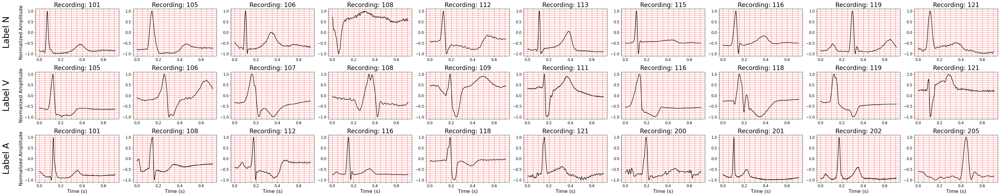

In [ ]:
# Normalize each signal between -1 and 1
ECG_signal_MLII_normalized_plot = []
for signal in ECG_signal_MLII:
    min_val = np.min(signal)
    max_val = np.max(signal)
    normalized_signal = 2 * (signal - min_val) / (max_val - min_val) - 1
    ECG_signal_MLII_normalized_plot.append(normalized_signal)
ECG_signal_MLII_normalized_plot = np.array(ECG_signal_MLII_normalized_plot)

# Selected labels
selected_labels = ['N', 'V', 'A']
number_of_plots_each_row = 10

# Initialize a 3x10 subplot layout
fig, axes = plt.subplots(len(selected_labels), number_of_plots_each_row, figsize=(number_of_plots_each_row*4.5, len(selected_labels)*3))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

# Flatten the axes for easy indexing
axes = axes.flatten()

plot_idx = 0  # To keep track of the current subplot index

# Plot the signals
for label_idx, label in enumerate(selected_labels):
    # Filter indices for this label
    label_indices = np.where(np.array(label_sub_class) == label)[0]

    # Track record numbers for this label
    record_numbers = label_recording[label_indices]

    # Plot signals for up to 10 unique records (if available)
    records_to_plot = np.unique(record_numbers)[:number_of_plots_each_row]

    for col_idx, record in enumerate(records_to_plot):
        if plot_idx >= len(axes):
            break

        # Find the index of the signal for the current label and record
        signal_index = label_indices[np.where(record_numbers == record)[0][0]]

        # Get the corresponding normalized signal
        signal = ECG_signal_MLII_normalized_plot[signal_index, :]

        # Generate time vector for the x-axis
        time = np.arange(len(signal)) / sampling_frequency

        # Plot the signal in the current subplot
        axes[plot_idx].plot(time, signal, color='black')
        axes[plot_idx].set_title(f"Recording: {record}", fontsize=20)

        row = plot_idx // number_of_plots_each_row
        col = plot_idx % number_of_plots_each_row

        # Show x-label only on the last row
        if row == len(selected_labels) - 1:
            axes[plot_idx].set_xlabel("Time (s)", fontsize=16)
        # Show y-label only on the first column of each row
        if col == 0:
            axes[plot_idx].set_ylabel("Normalized Amplitude", fontsize=16)
            # Add left-side label text further to the left and larger
            axes[plot_idx].text(-0.35, 0.5, f"Label {label}", fontsize=28, rotation=90,
                                va='center', ha='center', transform=axes[plot_idx].transAxes)

        axes[plot_idx].grid(True, which='both', axis='both', color='red', linestyle='-', linewidth=0.5)
        axes[plot_idx].minorticks_on()
        axes[plot_idx].tick_params(axis='both', which='major', labelsize=12)

        plot_idx += 1

# Remove unused subplots
for ax in axes[plot_idx:]:
    ax.remove()

plt.tight_layout()
plt.show()


## **6. Preprocessing and Filtering**

In [ ]:
# Apply median filtering to each normal signal segment
ECG_signal_MLII_filtered = np.zeros((np.shape(ECG_signal_MLII)))
ECG_signal_V1_filtered = np.zeros((np.shape(ECG_signal_V1)))

for i in range(np.shape(ECG_signal_MLII)[0]):
    # Subtract the median-filtered signal from the original signal
    ECG_signal_MLII_filtered[i, :] = ECG_signal_MLII[i, :] - scipy.signal.medfilt(ECG_signal_MLII[i, :], kernel_size=127)
    ECG_signal_V1_filtered[i, :] = ECG_signal_V1[i, :] - scipy.signal.medfilt(ECG_signal_V1[i, :], kernel_size=127)

print("MLII Filtered Signals Shape: ", np.shape(ECG_signal_MLII_filtered))
print("V1 Filtered Signals Shape: ", np.shape(ECG_signal_V1_filtered))

MLII Filtered Signals Shape:  (97117, 256)
V1 Filtered Signals Shape:  (97117, 256)


## **7. Shuffling Data**

In [ ]:
# Seed for reproducibility
np.random.seed(42)

# Generate random indices for shuffling
indices = np.random.permutation(len(ECG_signal_MLII_filtered))

# Shuffle all signals using the same indices
ECG_signal_MLII_filtered_shuffled = ECG_signal_MLII_filtered[indices]
ECG_signal_V1_filtered_shuffled = ECG_signal_V1_filtered[indices]

# Print shapes to verify
print("Shuffled MLII Signals Shape: ", np.shape(ECG_signal_MLII_filtered))
print("Shuffled V1 Signals Shape: ", np.shape(ECG_signal_V1_filtered))
print("AAMI Label Shape:", np.shape(label_AAMI_superclass))
print("Recording Label Shape:", np.shape(label_recording))
print("label_AAMI_superclass:", np.shape(label_AAMI_superclass))
print(np.unique(label_AAMI_superclass))
print(np.unique(label_recording))

Shuffled MLII Signals Shape:  (97117, 256)
Shuffled V1 Signals Shape:  (97117, 256)
AAMI Label Shape: (97117,)
Recording Label Shape: (97117,)
label_AAMI_superclass: (97117,)
[0 1 2 3 4 5]
[101 105 106 107 108 109 111 112 113 115 116 118 119 121 122 200 201 202
 203 205 207 208 209 210 212 213 214 215 217 219 220 221 222 223 228 230
 231 232 233 234]


## **8. Applying UMAP and t-SNE on Filtered Signal (All Recording)**

In [ ]:
ump = UMAP(n_components=2,
           min_dist=0.1,
           n_neighbors=15,
           random_state=42,
           init='pca') # options: spectral

tsne = TSNE(n_components=2, perplexity=30.0, random_state=42, init='pca')
pca = PCA(n_components=3, random_state=42)

In [ ]:
# PCA
start_time = time.time()
y_pca_signal_MLII = pca.fit_transform(ECG_signal_MLII_filtered_shuffled)
print(f"PCA MLII time: {time.time() - start_time:.2f} seconds")

start_time = time.time()
y_pca_signal_V1 = pca.fit_transform(ECG_signal_V1_filtered_shuffled)
print(f"PCA V1 time: {time.time() - start_time:.2f} seconds")

# t-SNE
start_time = time.time()
y_tsne_signal_MLII = tsne.fit_transform(ECG_signal_MLII_filtered_shuffled)
print(f"t-SNE MLII time: {time.time() - start_time:.2f} seconds")

start_time = time.time()
y_tsne_signal_V1 = tsne.fit_transform(ECG_signal_V1_filtered_shuffled)
print(f"t-SNE V1 time: {time.time() - start_time:.2f} seconds")

# UMAP
start_time = time.time()
y_umap_signal_MLII = ump.fit_transform(ECG_signal_MLII_filtered_shuffled)
print(f"UMAP MLII time: {time.time() - start_time:.2f} seconds")

start_time = time.time()
y_umap_signal_V1 = ump.fit_transform(ECG_signal_V1_filtered_shuffled)
print(f"UMAP V1 time: {time.time() - start_time:.2f} seconds")


PCA MLII time: 0.14 seconds
PCA V1 time: 0.13 seconds
t-SNE MLII time: 428.81 seconds
t-SNE V1 time: 432.48 seconds


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP MLII time: 102.74 seconds
UMAP V1 time: 86.59 seconds


## **9. Visualization**

### **9.1 All Labels**

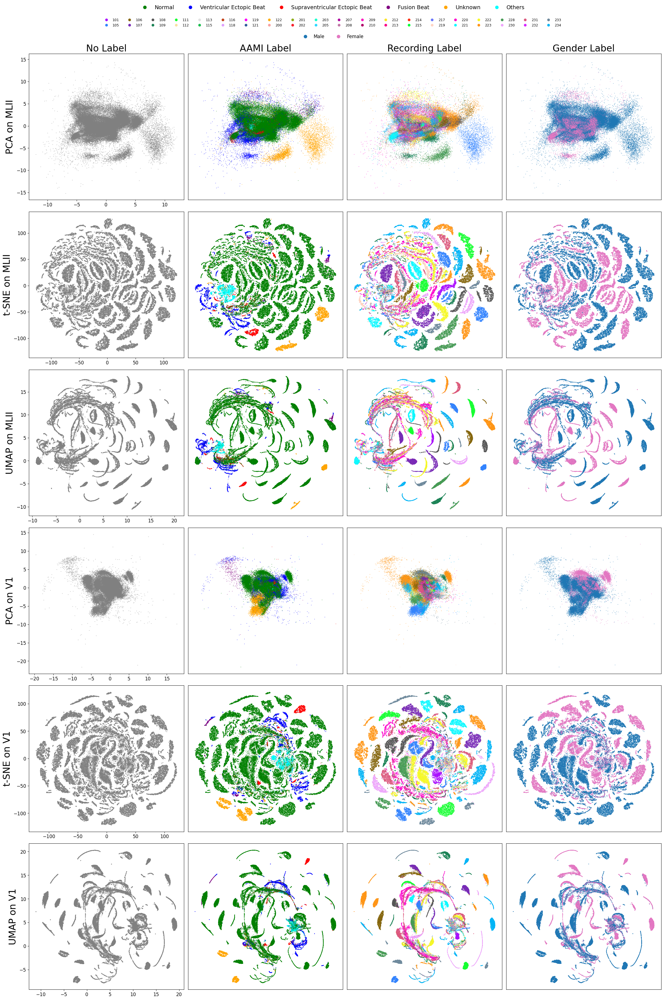

In [ ]:
# Define color maps
gray_cmap = 'gray'

aami_colors = ['green', 'blue', 'red', 'purple', 'orange', 'cyan']
aami_cmap = ListedColormap(aami_colors)
aami_classes = ['Normal', 'Ventricular Ectopic Beat', 'Supraventricular Ectopic Beat', 'Fusion Beat', 'Unknown', 'Others']

rec_colors = px.colors.qualitative.Alphabet + px.colors.qualitative.Light24
rec_colors = rec_colors[:40]
rec_cmap = ListedColormap(rec_colors)
rec_labels = np.unique(label_recording)

sex_colors = ['#1f77b4', '#e377c2']  # Blue, Magenta
sex_cmap = ListedColormap(sex_colors)
sex_classes = ['Male', 'Female']

# Create 6x4 subplots
fig, axes = plt.subplots(6, 4, figsize=(24, 36))
title_font_size = 24

# Column titles
column_titles = ['No Label', 'AAMI Label', 'Recording Label', 'Gender Label']

# Data mapping for plot order
dim_red_methods = {
    0: ('PCA on MLII', y_pca_signal_MLII),
    1: ('t-SNE on MLII', y_tsne_signal_MLII),
    2: ('UMAP on MLII', y_umap_signal_MLII),
    3: ('PCA on V1', y_pca_signal_V1),
    4: ('t-SNE on V1', y_tsne_signal_V1),
    5: ('UMAP on V1', y_umap_signal_V1)
}

for i in range(6):
    y_label, data = dim_red_methods[i]
    row_label = string.ascii_lowercase[i]  # 'a' to 'f'

    for j in range(4):
        ax = axes[i, j]

        # Set color and cmap
        if j == 0:
            c = 'gray'
            cmap = None
        elif j == 1:
            c = label_AAMI_superclass[indices]
            cmap = aami_cmap
        elif j == 2:
            c = label_recording[indices]
            cmap = rec_cmap
        else:
            c = np.take(label_sex, indices)
            cmap = sex_cmap

        ax.scatter(data[:, 0], data[:, 1], s=0.1, c=c, cmap=cmap)

        # Add subplot label like (a1), (a2), ...
        subplot_label = f'({row_label}{j+1})'
        # ax.text(0.01, 0.95, subplot_label, transform=ax.transAxes, fontsize=18, fontweight='bold', va='top', ha='left')

        # Set y-axis label and ticks only for first column
        if j == 0:
            ax.set_ylabel(y_label, fontsize=title_font_size)
            ax.tick_params(axis='y', labelsize=12)
            ax.tick_params(axis='x', labelsize=12)
        else:
            ax.set_yticks([])
            ax.set_yticklabels([])
            ax.set_xticks([])
            ax.set_xticklabels([])

        # Set column title for top row
        if i == 0:
            ax.set_title(column_titles[j], fontsize=title_font_size)

# Legends
handles_aami = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=aami_cmap(i / len(aami_classes)), markersize=10)
    for i in range(len(aami_classes))
]
fig.legend(handles_aami, aami_classes, loc='upper center', ncol=6, frameon=False, fontsize=14, bbox_to_anchor=(0.5, 1.0))

handles_rec = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=rec_cmap(i / len(rec_labels)), markersize=8)
    for i in range(len(rec_labels))
]
fig.legend(handles_rec, rec_labels, loc='upper center', ncol=20, frameon=False, fontsize=9, bbox_to_anchor=(0.5, 0.985))

handles_sex = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=sex_colors[0], markersize=10, label='Male'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=sex_colors[1], markersize=10, label='Female')
]
fig.legend(handles_sex, sex_classes, loc='upper center', ncol=2, frameon=False, fontsize=12, bbox_to_anchor=(0.5, 0.97))

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### **9.2. UMAP for Identification, One vs All (Supplementary Material)**

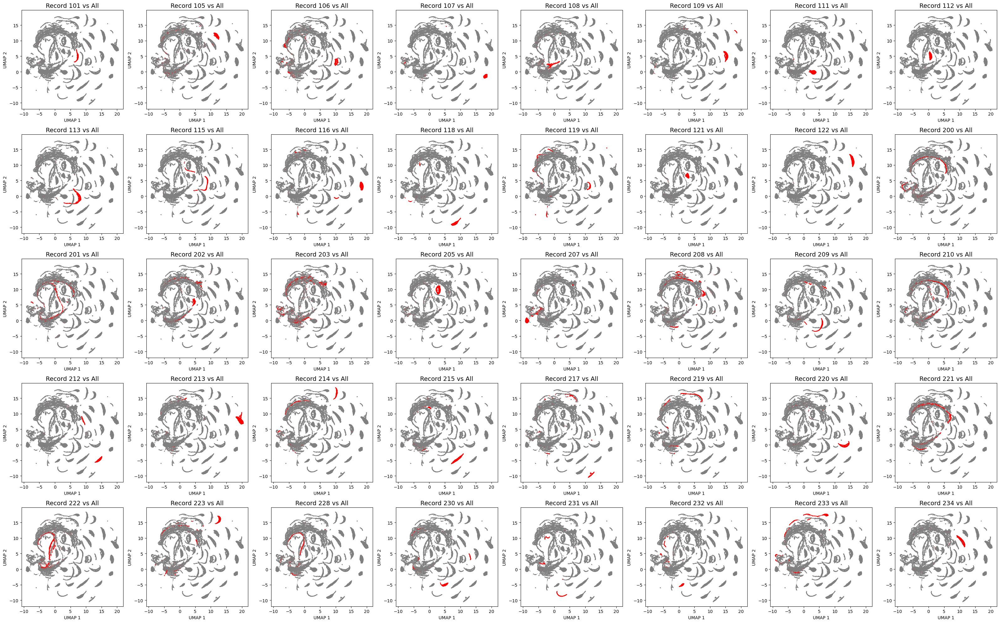

In [ ]:
# Define a colormap for binary labels
colors = ['red', 'grey']  # Red = target class, Grey = others
cmap = ListedColormap(colors)

# Create a 5 (rows) × 8 (columns) grid of subplots
fig, axes = plt.subplots(5, 8, figsize=(32, 20))  # Adjust size for readability

# Loop through each class and plot one-vs-all UMAP
for i in range(len(Record_number_list)):
    ax = axes[i // 8, i % 8]  # Correct subplot index for 8 columns per row

    # Binary labeling: 0 for current record, 1 for others
    binary_labels = np.where(label_recording[indices] == Record_number_list[i], 0, 1)

    # UMAP scatter plot
    ax.scatter(y_umap_signal_MLII[:, 0], y_umap_signal_MLII[:, 1], s=0.1, c=binary_labels, cmap=cmap)
    ax.set_title(f'Record {Record_number_list[i]} vs All', fontsize=14)
    ax.set_xlabel('UMAP 1', fontsize=10)
    ax.set_ylabel('UMAP 2', fontsize=10)
    # ax.set_xticks([])
    # ax.set_yticks([])

# Adjust layout
plt.tight_layout()
plt.show()


### **9.3. t-SNE for Identification, One vs All (Supplementary Material)**

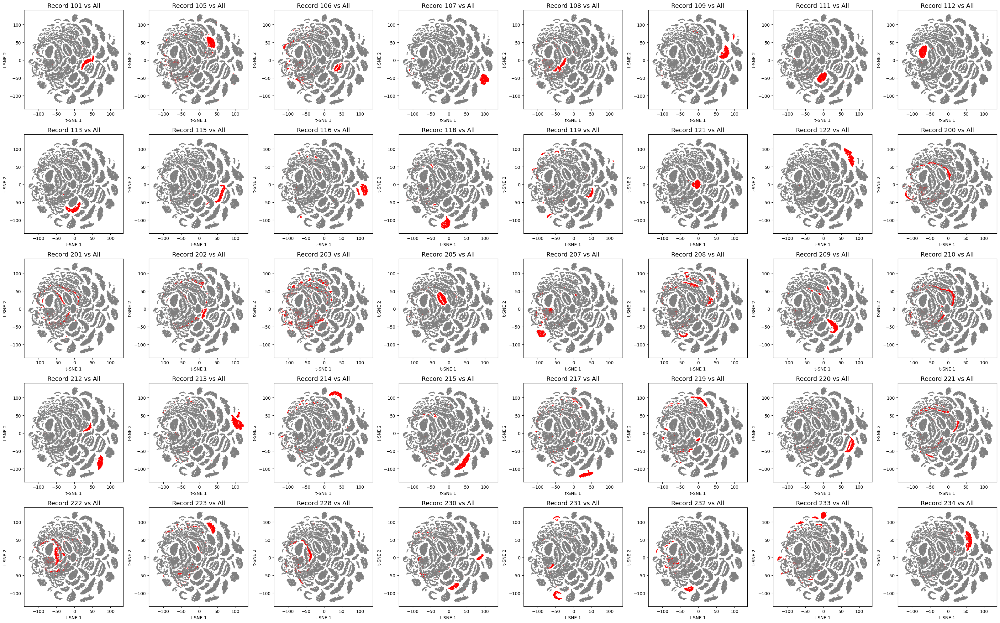

In [ ]:
# Define a colormap for binary labels
colors = ['red', 'grey']  # Red = target class, Grey = others
cmap = ListedColormap(colors)

# Create a 5 (rows) × 8 (columns) grid of subplots
fig, axes = plt.subplots(5, 8, figsize=(32, 20))  # Adjust size for readability

# Loop through each class and plot one-vs-all UMAP
for i in range(len(Record_number_list)):
    ax = axes[i // 8, i % 8]  # Correct subplot index for 8 columns per row

    # Binary labeling: 0 for current record, 1 for others
    binary_labels = np.where(label_recording[indices] == Record_number_list[i], 0, 1)

    # UMAP scatter plot
    ax.scatter(y_tsne_signal_MLII[:, 0], y_tsne_signal_MLII[:, 1], s=0.1, c=binary_labels, cmap=cmap)
    ax.set_title(f'Record {Record_number_list[i]} vs All', fontsize=14)
    ax.set_xlabel('t-SNE 1', fontsize=10)
    ax.set_ylabel('t-SNE 2', fontsize=10)
    # ax.set_xticks([])
    # ax.set_yticks([])

# Adjust layout
plt.tight_layout()
plt.show()


## **10. Evaluation**

In [ ]:
def evaluate_knn_classifier(X, y, n_neighbors=11, plot_flag=False):
    """
    Function to train a k-NN classifier, evaluate accuracy, and plot confusion matrix.

    Parameters:
    - X: Feature set (embedding data like UMAP, t-SNE, or PCA)
    - y: True labels (label_recording)
    - n_neighbors: Number of neighbors for k-NN classifier (default=11)
    - plot_flag: If True, plots the confusion matrix

    Returns:
    - overall_accuracy
    - conf_matrix
    - min_accuracy
    - median_accuracy
    - max_accuracy
    """
    # Encode the original labels
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(y)

    # Train the k-NN classifier
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn.fit(X, encoded_labels)

    # Predict the labels
    predicted_labels = knn.predict(X)

    # Compute accuracy
    overall_accuracy = accuracy_score(encoded_labels, predicted_labels)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(encoded_labels, predicted_labels)

    # Diagonal analysis
    diagonal_entries = np.diag(conf_matrix)
    total_per_class = np.sum(conf_matrix, axis=1)
    diagonal_accuracy = diagonal_entries / total_per_class

    min_accuracy = np.min(diagonal_accuracy)
    median_accuracy = np.median(diagonal_accuracy)
    max_accuracy = np.max(diagonal_accuracy)

    # Optional plot
    if plot_flag:
        plt.figure(figsize=(24, 20))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                    xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
        plt.title(f'Confusion Matrix for k-NN Classifier (k={n_neighbors})')
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.tight_layout()
        plt.show()

    return overall_accuracy, conf_matrix, min_accuracy, median_accuracy, max_accuracy


def calc_trustworthiness_for_sample(X_highd, X_lowd, k_list, sample_size=20000, random_state=42):
    n = X_highd.shape[0]
    np.random.seed(random_state)
    if n > sample_size:
        idx = np.random.choice(n, sample_size, replace=False)
        X_highd_sample = X_highd[idx]
        X_lowd_sample = X_lowd[idx]
    else:
        X_highd_sample = X_highd
        X_lowd_sample = X_lowd

    trust_values = {}
    for k in k_list:
        trust = trustworthiness(X_highd_sample, X_lowd_sample, n_neighbors=k)
        trust_values[k] = trust
    return trust_values


In [ ]:
def plot_accuracy(ax, x_values, y_umap_ml, y_tsne_ml, y_pca_ml, y_umap_v1, y_tsne_v1, y_pca_v1, title, ylabel):
    """Plots accuracy values for UMAP, t-SNE, and PCA on MLII and V1 datasets in a given subplot."""
    ax.plot(x_values, y_umap_ml, 'g-o', linestyle='solid', markersize=8, linewidth=2, label='UMAP on MLII')
    ax.plot(x_values, y_tsne_ml, 'b-s', linestyle='solid', markersize=8, linewidth=2, label='t-SNE on MLII')
    ax.plot(x_values, y_pca_ml, 'r-^', linestyle='solid', markersize=8, linewidth=2, label='PCA on MLII')
    ax.plot(x_values, y_umap_v1, 'g-o', linestyle='dashed', markersize=8, linewidth=2, label='UMAP on V1')
    ax.plot(x_values, y_tsne_v1, 'b-s', linestyle='dashed', markersize=8, linewidth=2, label='t-SNE on V1')
    ax.plot(x_values, y_pca_v1, 'r-^', linestyle='dashed', markersize=8, linewidth=2, label='PCA on V1')

    ax.set_xlabel('k (Number of Neighbors)', fontsize=18, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=18, fontweight='bold')  # Different ylabel per subplot
    ax.set_title(title, fontsize=22, fontweight='bold')
    ax.set_xticks(x_values)
    ax.grid(True, linestyle='--', alpha=0.6)
    # ax.set_ylim(0, 100)

### **10.1 KNN for Identification**

In [ ]:
# Accuracy values for three different conditions
y_umap_ml_1 = []
y_tsne_ml_1 = []
y_pca_ml_1 = []
y_umap_v1_1 = []
y_tsne_v1_1 = []
y_pca_v1_1 = []

y_umap_ml_2 = []
y_tsne_ml_2 = []
y_pca_ml_2 = []
y_umap_v1_2 = []
y_tsne_v1_2 = []
y_pca_v1_2 = []

y_umap_ml_3 = []
y_tsne_ml_3 = []
y_pca_ml_3 = []
y_umap_v1_3 = []
y_tsne_v1_3 = []
y_pca_v1_3 = []

y_umap_ml_4 = []
y_tsne_ml_4 = []
y_pca_ml_4 = []
y_umap_v1_4 = []
y_tsne_v1_4 = []
y_pca_v1_4 = []

n_neighbor_list = [11, 51, 101, 201]
for n_neighbors in n_neighbor_list:

    # UMAP ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = UMAP, Lead = MLII, Label = ID")
    accuracy_umap1, conf_matrix_umap1, min_accuracy_umap1, median_accuracy_umap1, max_accuracy_umap1 = evaluate_knn_classifier(y_umap_signal_MLII, label_recording[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_umap1 * 100:.2f}%")
    y_umap_ml_1.append(accuracy_umap1)
    print(f"Median Accuracy: {median_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_2.append(median_accuracy_umap1)
    print(f"Min Accuracy: {min_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_3.append(min_accuracy_umap1)
    print(f"Max Accuracy: {max_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_4.append(max_accuracy_umap1)
    print("-"*70)


    # UMAP ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = UMAP, Lead = V1, Label = ID")
    accuracy_umap2, conf_matrix_umap2, min_accuracy_umap2, median_accuracy_umap2, max_accuracy_umap2 = evaluate_knn_classifier(y_umap_signal_V1, label_recording[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_umap2 * 100:.2f}%")
    y_umap_v1_1.append(accuracy_umap2)
    print(f"Median Accuracy: {median_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_2.append(median_accuracy_umap2)
    print(f"Min Accuracy: {min_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_3.append(min_accuracy_umap2)
    print(f"Max Accuracy: {max_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_4.append(max_accuracy_umap2)
    print("-"*70)


    # t-SNE ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = t-SNE, Lead = MLII, Label = ID")
    accuracy_tsne1, conf_matrix_tsne1, min_accuracy_tsne1, median_accuracy_tsne1, max_accuracy_tsne1 = evaluate_knn_classifier(y_tsne_signal_MLII, label_recording[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_1.append(accuracy_tsne1)
    print(f"Median Accuracy: {median_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_2.append(median_accuracy_tsne1)
    print(f"Min Accuracy: {min_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_3.append(min_accuracy_tsne1)
    print(f"Max Accuracy: {max_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_4.append(max_accuracy_tsne1)
    print("-"*70)

    # t-SNE ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = t-SNE, Lead = V1, Label = ID")
    accuracy_tsne2, conf_matrix_tsne2, min_accuracy_tsne2, median_accuracy_tsne2, max_accuracy_tsne2 = evaluate_knn_classifier(y_tsne_signal_V1, label_recording[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_1.append(accuracy_tsne2)
    print(f"Median Accuracy: {median_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_2.append(median_accuracy_tsne2)
    print(f"Min Accuracy: {min_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_3.append(min_accuracy_tsne2)
    print(f"Max Accuracy: {max_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_4.append(max_accuracy_tsne2)
    print("-"*70)


    # PCA ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = PCA, Lead = MLII, Label = ID")
    accuracy_pca1, conf_matrix_pca1, min_accuracy_pca1, median_accuracy_pca1, max_accuracy_pca1 = evaluate_knn_classifier(y_pca_signal_MLII, label_recording[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_pca1 * 100:.2f}%")
    y_pca_ml_1.append(accuracy_pca1)
    print(f"Median Accuracy: {median_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_2.append(median_accuracy_pca1)
    print(f"Min Accuracy: {min_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_3.append(min_accuracy_pca1)
    print(f"Max Accuracy: {max_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_4.append(max_accuracy_pca1)
    print("-"*70)

    # PCA ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = PCA, Lead = V1, Label = ID")
    accuracy_pca2, conf_matrix_pca2, min_accuracy_pca2, median_accuracy_pca2, max_accuracy_pca2 = evaluate_knn_classifier(y_pca_signal_V1, label_recording[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_pca2 * 100:.2f}%")
    y_pca_v1_1.append(accuracy_pca2)
    print(f"Median Accuracy: {median_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_2.append(median_accuracy_pca2)
    print(f"Min Accuracy: {min_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_3.append(min_accuracy_pca2)
    print(f"Max Accuracy: {max_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_4.append(max_accuracy_pca2)
    print("-"*70)

identification = [y_umap_ml_1, y_tsne_ml_1, y_pca_ml_1, y_umap_v1_1, y_tsne_v1_1, y_pca_v1_1]

k in KNN = 11, Embedding = UMAP, Lead = MLII, Label = ID
Accuracy: 89.70%
Median Accuracy: 92.15%
Min Accuracy: 55.89%
Max Accuracy: 99.68%
----------------------------------------------------------------------
k in KNN = 11, Embedding = UMAP, Lead = V1, Label = ID
Accuracy: 88.97%
Median Accuracy: 94.03%
Min Accuracy: 53.67%
Max Accuracy: 99.60%
----------------------------------------------------------------------
k in KNN = 11, Embedding = t-SNE, Lead = MLII, Label = ID
Accuracy: 93.31%
Median Accuracy: 94.92%
Min Accuracy: 76.46%
Max Accuracy: 99.76%
----------------------------------------------------------------------
k in KNN = 11, Embedding = t-SNE, Lead = V1, Label = ID
Accuracy: 92.24%
Median Accuracy: 95.57%
Min Accuracy: 69.00%
Max Accuracy: 99.56%
----------------------------------------------------------------------
k in KNN = 11, Embedding = PCA, Lead = MLII, Label = ID
Accuracy: 70.33%
Median Accuracy: 70.80%
Min Accuracy: 44.22%
Max Accuracy: 96.12%
-------------------

### **10.2 KNN for Arrhythmia Detection with AAMI Labels**

In [ ]:
# Accuracy values for three different conditions
y_umap_ml_1 = []
y_tsne_ml_1 = []
y_pca_ml_1 = []
y_umap_v1_1 = []
y_tsne_v1_1 = []
y_pca_v1_1 = []

y_umap_ml_2 = []
y_tsne_ml_2 = []
y_pca_ml_2 = []
y_umap_v1_2 = []
y_tsne_v1_2 = []
y_pca_v1_2 = []

y_umap_ml_3 = []
y_tsne_ml_3 = []
y_pca_ml_3 = []
y_umap_v1_3 = []
y_tsne_v1_3 = []
y_pca_v1_3 = []

y_umap_ml_4 = []
y_tsne_ml_4 = []
y_pca_ml_4 = []
y_umap_v1_4 = []
y_tsne_v1_4 = []
y_pca_v1_4 = []


for n_neighbors in [11, 51, 101, 201]:

    # UMAP ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = UMAP, Lead = MLII, Label = AAMI")
    accuracy_umap1, conf_matrix_umap1, min_accuracy_umap1, median_accuracy_umap1, max_accuracy_umap1 = evaluate_knn_classifier(y_umap_signal_MLII, label_AAMI_superclass[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_umap1 * 100:.2f}%")
    y_umap_ml_1.append(accuracy_umap1)
    print(f"Median Accuracy: {median_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_2.append(median_accuracy_umap1)
    print(f"Min Accuracy: {min_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_3.append(min_accuracy_umap1)
    print(f"Max Accuracy: {max_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_4.append(max_accuracy_umap1)
    print("-"*70)


    # UMAP ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = UMAP, Lead = V1, Label = AAMI")
    accuracy_umap2, conf_matrix_umap2, min_accuracy_umap2, median_accuracy_umap2, max_accuracy_umap2 = evaluate_knn_classifier(y_umap_signal_V1, label_AAMI_superclass[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_umap2 * 100:.2f}%")
    y_umap_v1_1.append(accuracy_umap2)
    print(f"Median Accuracy: {median_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_2.append(median_accuracy_umap2)
    print(f"Min Accuracy: {min_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_3.append(min_accuracy_umap2)
    print(f"Max Accuracy: {max_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_4.append(max_accuracy_umap2)
    print("-"*70)


    # t-SNE ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = t-SNE, Lead = MLII, Label = AAMI")
    accuracy_tsne1, conf_matrix_tsne1, min_accuracy_tsne1, median_accuracy_tsne1, max_accuracy_tsne1 = evaluate_knn_classifier(y_tsne_signal_MLII, label_AAMI_superclass[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_1.append(accuracy_tsne1)
    print(f"Median Accuracy: {median_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_2.append(median_accuracy_tsne1)
    print(f"Min Accuracy: {min_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_3.append(min_accuracy_tsne1)
    print(f"Max Accuracy: {max_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_4.append(max_accuracy_tsne1)
    print("-"*70)

    # t-SNE ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = t-SNE, Lead = V1, Label = AAMI")
    accuracy_tsne2, conf_matrix_tsne2, min_accuracy_tsne2, median_accuracy_tsne2, max_accuracy_tsne2 = evaluate_knn_classifier(y_tsne_signal_V1, label_AAMI_superclass[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_1.append(accuracy_tsne2)
    print(f"Median Accuracy: {median_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_2.append(median_accuracy_tsne2)
    print(f"Min Accuracy: {min_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_3.append(min_accuracy_tsne2)
    print(f"Max Accuracy: {max_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_4.append(max_accuracy_tsne2)
    print("-"*70)


    # PCA ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = PCA, Lead = MLII, Label = AAMI")
    accuracy_pca1, conf_matrix_pca1, min_accuracy_pca1, median_accuracy_pca1, max_accuracy_pca1 = evaluate_knn_classifier(y_pca_signal_MLII, label_AAMI_superclass[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_pca1 * 100:.2f}%")
    y_pca_ml_1.append(accuracy_pca1)
    print(f"Median Accuracy: {median_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_2.append(median_accuracy_pca1)
    print(f"Min Accuracy: {min_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_3.append(min_accuracy_pca1)
    print(f"Max Accuracy: {max_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_4.append(max_accuracy_pca1)
    print("-"*70)

    # PCA ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = PCA, Lead = V1, Label = AAMI")
    accuracy_pca2, conf_matrix_pca2, min_accuracy_pca2, median_accuracy_pca2, max_accuracy_pca2 = evaluate_knn_classifier(y_pca_signal_V1, label_AAMI_superclass[indices], n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_pca2 * 100:.2f}%")
    y_pca_v1_1.append(accuracy_pca2)
    print(f"Median Accuracy: {median_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_2.append(median_accuracy_pca2)
    print(f"Min Accuracy: {min_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_3.append(min_accuracy_pca2)
    print(f"Max Accuracy: {max_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_4.append(max_accuracy_pca2)
    print("-"*70)

AAMI = [y_umap_ml_1, y_tsne_ml_1, y_pca_ml_1, y_umap_v1_1, y_tsne_v1_1, y_pca_v1_1]

k in KNN = 11, Embedding = UMAP, Lead = MLII, Label = AAMI
Accuracy: 97.24%
Median Accuracy: 93.20%
Min Accuracy: 53.90%
Max Accuracy: 99.09%
----------------------------------------------------------------------
k in KNN = 11, Embedding = UMAP, Lead = V1, Label = AAMI
Accuracy: 95.95%
Median Accuracy: 82.02%
Min Accuracy: 57.93%
Max Accuracy: 98.58%
----------------------------------------------------------------------
k in KNN = 11, Embedding = t-SNE, Lead = MLII, Label = AAMI
Accuracy: 97.86%
Median Accuracy: 94.86%
Min Accuracy: 68.51%
Max Accuracy: 99.26%
----------------------------------------------------------------------
k in KNN = 11, Embedding = t-SNE, Lead = V1, Label = AAMI
Accuracy: 96.87%
Median Accuracy: 87.81%
Min Accuracy: 71.28%
Max Accuracy: 98.72%
----------------------------------------------------------------------
k in KNN = 11, Embedding = PCA, Lead = MLII, Label = AAMI
Accuracy: 94.39%
Median Accuracy: 78.37%
Min Accuracy: 43.70%
Max Accuracy: 98.30%
---------

### **10.3 KNN for Gender Clsssification**

In [ ]:
# Accuracy values for three different conditions
y_umap_ml_1 = []
y_tsne_ml_1 = []
y_pca_ml_1 = []
y_umap_v1_1 = []
y_tsne_v1_1 = []
y_pca_v1_1 = []

y_umap_ml_2 = []
y_tsne_ml_2 = []
y_pca_ml_2 = []
y_umap_v1_2 = []
y_tsne_v1_2 = []
y_pca_v1_2 = []

y_umap_ml_3 = []
y_tsne_ml_3 = []
y_pca_ml_3 = []
y_umap_v1_3 = []
y_tsne_v1_3 = []
y_pca_v1_3 = []

y_umap_ml_4 = []
y_tsne_ml_4 = []
y_pca_ml_4 = []
y_umap_v1_4 = []
y_tsne_v1_4 = []
y_pca_v1_4 = []


for n_neighbors in [11, 51, 101, 201]:

    # UMAP ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = UMAP, Lead = MLII, Label = Gender")
    accuracy_umap1, conf_matrix_umap1, min_accuracy_umap1, median_accuracy_umap1, max_accuracy_umap1 = evaluate_knn_classifier(y_umap_signal_MLII, np.take(label_age, indices), n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_umap1 * 100:.2f}%")
    y_umap_ml_1.append(accuracy_umap1)
    print(f"Median Accuracy: {median_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_2.append(median_accuracy_umap1)
    print(f"Min Accuracy: {min_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_3.append(min_accuracy_umap1)
    print(f"Max Accuracy: {max_accuracy_umap1 * 100:.2f}%")
    y_umap_ml_4.append(max_accuracy_umap1)
    print("-"*70)


    # UMAP ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = UMAP, Lead = V1, Label = Gender")
    accuracy_umap2, conf_matrix_umap2, min_accuracy_umap2, median_accuracy_umap2, max_accuracy_umap2 = evaluate_knn_classifier(y_umap_signal_V1, np.take(label_age, indices), n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_umap2 * 100:.2f}%")
    y_umap_v1_1.append(accuracy_umap2)
    print(f"Median Accuracy: {median_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_2.append(median_accuracy_umap2)
    print(f"Min Accuracy: {min_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_3.append(min_accuracy_umap2)
    print(f"Max Accuracy: {max_accuracy_umap2 * 100:.2f}%")
    y_umap_v1_4.append(max_accuracy_umap2)
    print("-"*70)


    # t-SNE ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = t-SNE, Lead = MLII, Label = Gender")
    accuracy_tsne1, conf_matrix_tsne1, min_accuracy_tsne1, median_accuracy_tsne1, max_accuracy_tsne1 = evaluate_knn_classifier(y_tsne_signal_MLII, np.take(label_age, indices), n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_1.append(accuracy_tsne1)
    print(f"Median Accuracy: {median_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_2.append(median_accuracy_tsne1)
    print(f"Min Accuracy: {min_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_3.append(min_accuracy_tsne1)
    print(f"Max Accuracy: {max_accuracy_tsne1 * 100:.2f}%")
    y_tsne_ml_4.append(max_accuracy_tsne1)
    print("-"*70)

    # t-SNE ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = t-SNE, Lead = V1, Label = Gender")
    accuracy_tsne2, conf_matrix_tsne2, min_accuracy_tsne2, median_accuracy_tsne2, max_accuracy_tsne2 = evaluate_knn_classifier(y_tsne_signal_V1, np.take(label_age, indices), n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_1.append(accuracy_tsne2)
    print(f"Median Accuracy: {median_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_2.append(median_accuracy_tsne2)
    print(f"Min Accuracy: {min_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_3.append(min_accuracy_tsne2)
    print(f"Max Accuracy: {max_accuracy_tsne2 * 100:.2f}%")
    y_tsne_v1_4.append(max_accuracy_tsne2)
    print("-"*70)


    # PCA ECG 1
    print(f"k in KNN = {n_neighbors}, Embedding = PCA, Lead = V1, Label = Gender")
    accuracy_pca1, conf_matrix_pca1, min_accuracy_pca1, median_accuracy_pca1, max_accuracy_pca1 = evaluate_knn_classifier(y_pca_signal_MLII, np.take(label_age, indices), n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_pca1 * 100:.2f}%")
    y_pca_ml_1.append(accuracy_pca1)
    print(f"Median Accuracy: {median_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_2.append(median_accuracy_pca1)
    print(f"Min Accuracy: {min_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_3.append(min_accuracy_pca1)
    print(f"Max Accuracy: {max_accuracy_pca1 * 100:.2f}%")
    y_pca_ml_4.append(max_accuracy_pca1)
    print("-"*70)

    # PCA ECG 2
    print(f"k in KNN = {n_neighbors}, Embedding = PCA, Lead = V1, Label = Gender")
    accuracy_pca2, conf_matrix_pca2, min_accuracy_pca2, median_accuracy_pca2, max_accuracy_pca2 = evaluate_knn_classifier(y_pca_signal_V1, np.take(label_age, indices), n_neighbors=n_neighbors)
    print(f"Accuracy: {accuracy_pca2 * 100:.2f}%")
    y_pca_v1_1.append(accuracy_pca2)
    print(f"Median Accuracy: {median_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_2.append(median_accuracy_pca2)
    print(f"Min Accuracy: {min_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_3.append(min_accuracy_pca2)
    print(f"Max Accuracy: {max_accuracy_pca2 * 100:.2f}%")
    y_pca_v1_4.append(max_accuracy_pca2)
    print("-"*70)

gender = [y_umap_ml_1, y_tsne_ml_1, y_pca_ml_1, y_umap_v1_1, y_tsne_v1_1, y_pca_v1_1]

k in KNN = 11, Embedding = UMAP, Lead = MLII, Label = Gender
Accuracy: 89.89%
Median Accuracy: 92.40%
Min Accuracy: 57.24%
Max Accuracy: 98.60%
----------------------------------------------------------------------
k in KNN = 11, Embedding = UMAP, Lead = V1, Label = Gender
Accuracy: 89.51%
Median Accuracy: 93.33%
Min Accuracy: 54.22%
Max Accuracy: 98.55%
----------------------------------------------------------------------
k in KNN = 11, Embedding = t-SNE, Lead = MLII, Label = Gender
Accuracy: 93.52%
Median Accuracy: 94.86%
Min Accuracy: 77.27%
Max Accuracy: 98.82%
----------------------------------------------------------------------
k in KNN = 11, Embedding = t-SNE, Lead = V1, Label = Gender
Accuracy: 92.61%
Median Accuracy: 94.97%
Min Accuracy: 69.12%
Max Accuracy: 98.70%
----------------------------------------------------------------------
k in KNN = 11, Embedding = PCA, Lead = V1, Label = Gender
Accuracy: 70.76%
Median Accuracy: 71.35%
Min Accuracy: 46.65%
Max Accuracy: 95.98%
-

### **10.4 Trustworthiness**

In [ ]:
k_values = [11, 51, 101, 201]

trust_umap_MLII = calc_trustworthiness_for_sample(ECG_signal_MLII_filtered, y_umap_signal_MLII, k_values)
trust_tsne_MLII = calc_trustworthiness_for_sample(ECG_signal_MLII_filtered, y_tsne_signal_MLII, k_values)
trust_pca_MLII  = calc_trustworthiness_for_sample(ECG_signal_MLII_filtered, y_pca_signal_MLII, k_values)

trust_umap_V1 = calc_trustworthiness_for_sample(ECG_signal_V1_filtered, y_umap_signal_V1, k_values)
trust_tsne_V1 = calc_trustworthiness_for_sample(ECG_signal_V1_filtered, y_tsne_signal_V1, k_values)
trust_pca_V1  = calc_trustworthiness_for_sample(ECG_signal_V1_filtered, y_pca_signal_V1, k_values)

print("Trustworthiness for MLII:")
print("UMAP:", trust_umap_MLII)
print("t-SNE:", trust_tsne_MLII)
print("PCA:", trust_pca_MLII)

print("Trustworthiness for V1:")
print("UMAP:", trust_umap_V1)
print("t-SNE:", trust_tsne_V1)
print("PCA:", trust_pca_V1)


trustworhiness_all = [trust_umap_MLII, trust_tsne_MLII, trust_pca_MLII, trust_umap_V1, trust_tsne_V1, trust_pca_V1]
first_trust_values = [trustworhiness_all[0][k] for k in sorted(trustworhiness_all[0].keys())]
trust_lists = [[d[k] for k in sorted(d.keys())] for d in trustworhiness_all]

Trustworthiness for MLII:
UMAP: {11: np.float64(0.4987658650762239), 51: np.float64(0.5006570535778433), 101: np.float64(0.5011684288214191), 201: np.float64(0.5027104367996549)}
t-SNE: {11: np.float64(0.4987378990323593), 51: np.float64(0.5004961693205114), 101: np.float64(0.5016002361761267), 201: np.float64(0.5026243810771505)}
PCA: {11: np.float64(0.4995127581171268), 51: np.float64(0.5008338024925374), 101: np.float64(0.5018218395448977), 201: np.float64(0.5033312736879113)}
Trustworthiness for V1:
UMAP: {11: np.float64(0.4998840405253556), 51: np.float64(0.5001153293119687), 101: np.float64(0.5004044189304058), 201: np.float64(0.501594238018962)}
t-SNE: {11: np.float64(0.4997111735884593), 51: np.float64(0.5003273580736817), 101: np.float64(0.5008830314349452), 201: np.float64(0.5023916423062876)}
PCA: {11: np.float64(0.4991077913954134), 51: np.float64(0.5000797648889401), 101: np.float64(0.5005848527771459), 201: np.float64(0.5021951203344633)}


### **10.5 Visualization**

/tmp/ipython-input-1346622593.py:3: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "g-o" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot(x_values, y_umap_ml, 'g-o', linestyle='solid', markersize=8, linewidth=2, label='UMAP on MLII')
/tmp/ipython-input-1346622593.py:4: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-s" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot(x_values, y_tsne_ml, 'b-s', linestyle='solid', markersize=8, linewidth=2, label='t-SNE on MLII')
/tmp/ipython-input-1346622593.py:5: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "r-^" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot(x_values, y_pca_ml, 'r-^', linestyle='solid', markersize=8, linewidth=2, label='PCA on MLII')
/tmp/ipython-input-1346622593.py:6: UserWarning: linestyle is red

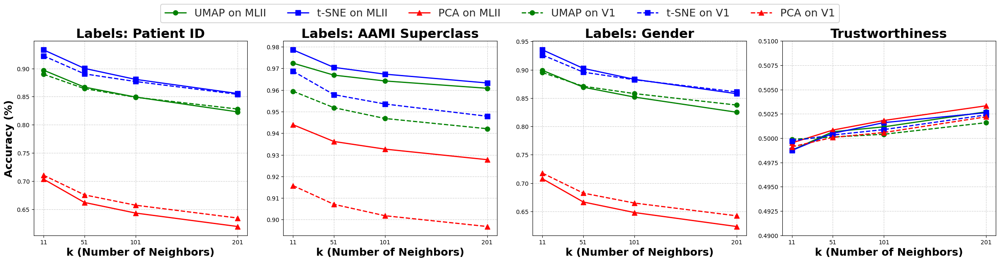

In [ ]:
# Data points
x_values = [11, 51, 101, 201]

# Different y-axis labels for each subplot
y_labels = ["Accuracy (%)", "Accuracy (%)", "Accuracy (%)"]

# Create 1x3 subplot
fig, axes = plt.subplots(1, 4, figsize=(24, 6))
sns.set_style("whitegrid")
sns.set_context("talk")

# Plot each subplot
plot_accuracy(axes[0], x_values, identification[0], identification[1], identification[2], identification[3], identification[4], identification[5], "Labels: Patient ID", y_labels[0])
plot_accuracy(axes[1], x_values, AAMI[0], AAMI[1], AAMI[2], AAMI[3], AAMI[4], AAMI[5], "Labels: AAMI Superclass", "")
plot_accuracy(axes[2], x_values, gender[0], gender[1], gender[2], gender[3], gender[4], gender[5], "Labels: Gender", "")
plot_accuracy(axes[3], x_values, trust_lists[0], trust_lists[1], trust_lists[2], trust_lists[3], trust_lists[4], trust_lists[5], "Trustworthiness", "")
axes[3].set_ylim(0.49, 0.51)
# Create a unique legend on top
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', fontsize=18, ncol=6, bbox_to_anchor=(0.5, 1.07))

plt.tight_layout()
plt.show()